In [1]:
import pickle
import matplotlib.pyplot as plt

In [2]:
def load_pkl_dict(filename):
    folder = "./experiment_data/"
    with open(folder + filename, "rb") as f:
        return pickle.load(f)

In [3]:
def negative_fix_comparison(alphas):
    original = [] 
    abs_rev_actv = []
    value_shift = []

    for alpha in alphas:
        original.append(load_pkl_dict(f"oscr_data_base_1_1_{alpha}_Original.pkl"))
        abs_rev_actv.append(load_pkl_dict(f"oscr_data_base_1_1_{alpha}_ABS_REV_ACTV.pkl"))
        value_shift.append(load_pkl_dict(f"oscr_data_base_1_1_{alpha}_VALUE_SHIFT.pkl"))
    return original, abs_rev_actv, value_shift

In [14]:
def basic_plot_setup(rows, cols):
    for row in range(rows):
        for col in range(cols):
            axs[row][col].legend(loc="upper left")
            axs[row][col].set_xlabel('FPR')
            axs[row][col].set_ylabel('CCR')
            axs[row][col].grid()
            axs[row][col].set_xscale('log')
            # axs[row][col].set_xlim([0, 1])  # sets the x-axis limits
            axs[row][col].set_ylim([0, 1]) # sets the y-axis limits
            axs[row][col].set_xlim(8 * 1e-5, 1.4)
    return axs

In [15]:
def plot_negative_fix_comparison(alphas, original, abs_rev_actv, vaule_shift):
    fig, axs = plt.subplots(len(original[0].keys()), 3)
    negative_fixes = ["Original", "VALUE_SHIFT", "ABS_REC_ACTV"]
    fig.set_figheight(200)
    fig.set_figwidth(20)
    
    for alpha in range(len(alphas)):
        for id, key in enumerate(original[0].keys()):
            axs[id][0].title.set_text(key)
            axs[id][0].plot(original[alpha][key][1], original[alpha][key][0], label=alphas[alpha])
            axs[id][1].title.set_text(key)
            axs[id][1].plot(abs_rev_actv[alpha][key][1], abs_rev_actv[alpha][key][0], label=alphas[alpha])
            axs[id][2].title.set_text(key)
            axs[id][2].plot(value_shift[alpha][key][1], value_shift[alpha][key][0], label=alphas[alpha])
    
    for row in range(len(original[0].keys())):
        for col in range(len(negative_fixes)):
            axs[row][col].legend(loc="upper left")
            axs[row][col].set_xlabel('FPR')
            axs[row][col].set_ylabel('CCR')
            axs[row][col].grid()
            axs[row][col].set_xscale('log')
            # axs[row][col].set_xlim([0, 1])  # sets the x-axis limits
            axs[row][col].set_ylim([0, 1]) # sets the y-axis limits
            axs[row][col].set_xlim(8 * 1e-5, 1.4)
    plt.tight_layout()
    plt.show()

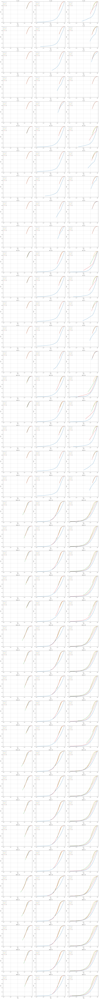

In [16]:
alphas = [-1, 5, 7, 10]
original, abs_rec_actv, value_shift = negative_fix_comparison(alphas)
plot_negative_fix_comparison(alphas, original, abs_rec_actv, value_shift)

In [7]:
def plot_negative_fix_alpha_comparison(alphas, original, abs_rev_actv, value_shift):
    rows = len(original[0].keys())
    cols = len(alphas)
    fig, axs = plt.subplots(rows, cols)
    negative_fixes = ["Original", "VALUE_SHIFT", "ABS_REC_ACTV"]
    fig.set_figheight(200)
    fig.set_figwidth(20)
    
    for alpha in range(len(alphas)):
        for id, key in enumerate(original[0].keys()):
            axs[id][alpha].title.set_text(f"{key}- {alphas[alpha]}")
            axs[id][alpha].plot(original[alpha][key][1], original[alpha][key][0], label="Original")
            axs[id][alpha].plot(abs_rev_actv[alpha][key][1], abs_rev_actv[alpha][key][0], label="Abs Values")
            axs[id][alpha].plot(value_shift[alpha][key][1], value_shift[alpha][key][0], label="Value Shift")
            
    for row in range(rows):
        for col in range(cols):
            axs[row][col].legend(loc="lower right")
            axs[row][col].set_xlabel('FPR')
            axs[row][col].set_ylabel('CCR')
            axs[row][col].grid()
            axs[row][col].set_xscale('log')
            # axs[row][col].set_xlim([0, 1])  # sets the x-axis limits
            axs[row][col].set_ylim([0, 1]) # sets the y-axis limits
            axs[row][col].set_xlim(8 * 1e-5, 1.4)
    

    plt.tight_layout()
    plt.show()

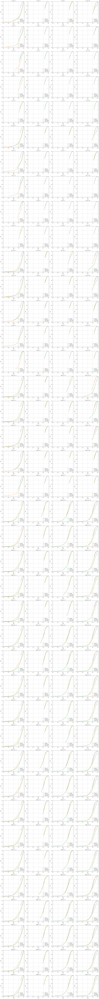

In [8]:
plot_negative_fix_alpha_comparison(alphas, original, abs_rec_actv, value_shift)

In [9]:
def setup_cluster_comparison(alphas, n_input_cluster, n_feature_cluster, negative_fix):
    feature_cluster = []
    base = []
    input_cluster = []
    input_feature_cluster = []
    for alpha in alphas:
        feature_cluster.append(load_pkl_dict(f"oscr_data_feature-cluster_1_{n_feature_cluster}_{alpha}_{negative_fix}.pkl"))
        base.append(load_pkl_dict(f"oscr_data_base_1_1_{alpha}_{negative_fix}.pkl"))
        input_cluster.append(load_pkl_dict(f"oscr_data_input-cluster_{n_input_cluster}_1_{alpha}_{negative_fix}.pkl"))
        input_feature_cluster.append(load_pkl_dict(f"oscr_data_input-feature-cluster_{n_input_cluster}_{n_feature_cluster}_{alpha}_{negative_fix}.pkl"))
    return base, input_cluster, feature_cluster, input_feature_cluster

In [10]:
def plot_cluster_comparison(alphas, base, input_cluster, feature_cluster, input_feature_cluster):
    rows = len(base[0].keys())
    cols = len(alphas)
    fig, axs = plt.subplots(rows, cols)
    fig.set_figheight(200)
    fig.set_figwidth(20)
    
    for col in range(cols):
        for row, key in enumerate(base[0].keys()):
            axs[row][col].title.set_text(f"{key}-{alphas[col]}")
            axs[row][col].plot(base[col][key][1], base[col][key][0], label="Base")
            axs[row][col].plot(feature_cluster[col][key][1], feature_cluster[col][key][0], label="Feature Cluster")
            axs[row][col].plot(input_cluster[col][key][1], input_cluster[col][key][0], label="Input Cluster")
            axs[row][col].plot(input_feature_cluster[col][key][1], input_feature_cluster[col][key][0], label="Input Feature Cluster")
    
    
    for row in range(len(base[0].keys())):
        for col in range(len(negative_fixes)):
            axs[row][col].legend(loc="upper left")
            axs[row][col].set_xlabel('FPR')
            axs[row][col].set_ylabel('CCR')
            axs[row][col].grid()
            axs[row][col].set_xscale('log')
            axs[row][col].set_xlim(8 * 1e-5, 1.4)
           # axs[row][col].set_xlim([0, 1])  # sets the x-axis limits
            axs[row][col].set_ylim([0, 1])  # sets the y-axis limits
    plt.tight_layout()
    plt.show()

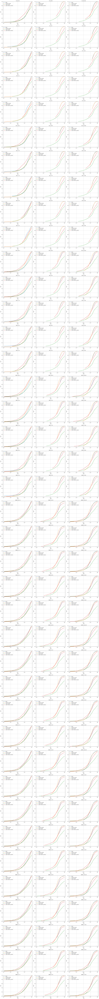

In [17]:
alphas = [-1, 5, 10]
n_input_cluster = 5
n_feature_cluster = 5
negative_fixes = negative_fixes = ["Original", "VALUE_SHIFT", "ABS_REV_ACTV"]
base, input_cluster, feature_cluster, input_feature_cluster = setup_cluster_comparison(alphas, n_input_cluster, n_feature_cluster, negative_fixes[2])
plot_cluster_comparison(alphas, base, input_cluster, feature_cluster, input_feature_cluster)

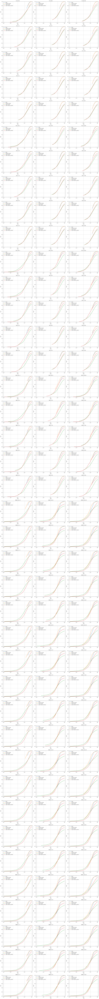

In [12]:
alphas = [-1, 5, 10]
n_input_cluster = 4
n_feature_cluster = 4
base, input_cluster, feature_cluster, input_feature_cluster = setup_cluster_comparison(alphas, n_input_cluster, n_feature_cluster, negative_fixes[0])
plot_cluster_comparison(alphas, base, input_cluster, feature_cluster, input_feature_cluster)